# Intro
This notebook is used to generate a labeled road dataset drived from a road data generated from OpenStreetMap (OSM). The dataset will be an image with a size of 512x512x4 and associated road binary mask of the same size.
## Installing packages

In [1]:
!pip install -q osmnx geopandas rasterio
!pip install -q geemap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.5/95.5 kB 3.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 22.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 56.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.4/16.4 MB 84.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 88.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 21.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 53.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.6/98.6 kB 10.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.5/130.5 kB 14.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 11.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 45.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.5/46.5 kB 4.1 MB/s eta 0:00:00
 

## Importing Libraries

In [20]:
import geemap.foliumap as geemap
import osmnx as ox
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point, LineString, Polygon
import osmnx as ox
import rasterio
from rasterio.features import rasterize
import numpy as np
from pyproj import CRS
from shapely.ops import transform
from functools import partial
import pyproj
import ee
from rasterio.windows import Window
import time
import pandas as pd
import os
from os.path import isfile, join
from rasterio.features import geometry_mask
import os
import pyarrow as pa
import pyarrow.parquet as pq
from osgeo import gdal, osr
import random
from google.colab import drive

## Setup GEE and Drive
You need to connect to GEE to download satellite images and to Google Drive to retrive those satellite images and other files.

In [4]:
drive.mount('/content/drive')

# Authenticate to the Earth Engine servers
try:
    ee.Initialize()
except Exception as e:
    ee.Authenticate()
    ee.Initialize()
    ee.Initialize()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Dowload Roads
Downloading road graph vector data and storing it as GraphML file.

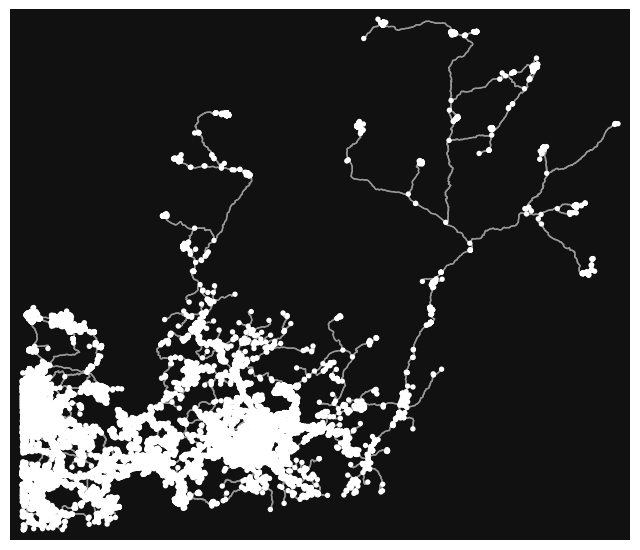

{'living_street', 'road', 'path', 'tertiary_link', 'cycleway', 'primary_link', 'residential', 'tertiary', 'service', 'primary', 'track', 'pedestrian', 'steps', 'secondary', 'unclassified', 'secondary_link', 'trunk_link', 'trunk', 'footway'}


In [11]:
# You can skip this step of downloading grpah file if you already have it
north, south, east, west = 55.9581118306628, 49.130107881544774, -74.81209455223167, -96.44654683079774 # Big geographic area
if False:
    graph_file = "/content/BigRoadImage_graph_file.graphml"

    # Use osmnx to download the road network
    #north, south, east, west = 50.075294571967845, 49.930778473382304, -92.73648955290895, -93.05064101218355 # Small geographic area
    G = ox.graph_from_bbox(north, south, east, west, network_type='all_private')

    ox.save_graphml(G, filepath=graph_file)
else:
    # Load previously saved graph file
    graph_file = "/content/drive/MyDrive/GreenGuardians/data/raw/road/BigRoadImage_graph_file.graphml"
    G = ox.load_graphml(filepath=graph_file)

ox.plot_graph(G)
plt.show()

# Get the road types
road_types = []
for data in G.edges(data=True):
    if 'highway' in data[2].keys():
        road_type = data[2]['highway']
        if type(road_type) is list:
            road_type = road_type[0]
        road_types.append(road_type)

# Print the unique road types
print(set(road_types))

# Convert the edges (roads) to a GeoDataFrame
gdf_edges = ox.graph_to_gdfs(G, nodes=False, fill_edge_geometry=True)

geom_lines = [geom for geom in gdf_edges.geometry]

# Download Sentinel-2 image

For the given rectangle shaped location, we download the satellite data. Modify the rectangle coordinates to get a different size/location image. Download time is directly proportional to the the area size. It might take hours for large areas and make sure that you have enough space on Google Drive. You can optionally disable the export part if you already have the data and avoid a mistake of re-running it.

In [12]:
# You can disable exporting to avoid re-generting again and again
disable_export = True

In [13]:
# Removing clouds
def maskS2clouds(image):
  qa = image.select('QA60')

  # Bits 10 and 11 are clouds and cirrus, respectively.
  cloudBitMask = 1 << 10
  cirrusBitMask = 1 << 11

  # Both flags should be set to zero, indicating clear conditions.
  mask = qa.bitwiseAnd(cloudBitMask).eq(0) \
      .And(qa.bitwiseAnd(cirrusBitMask).eq(0))

  return image.updateMask(mask).divide(10000)

# Harmonized Sentinel-2 MSI: MultiSpectral Instrument, Level-2A
image = ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED') \
                  .filterDate('2023-05-01', '2023-09-30') \
                  .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE',20)) \
                  .map(maskS2clouds).select('B4', 'B3', 'B2', 'B8').median()

# Define the region of interes
long_min, lat_min, long_max, lat_max = west, south, east, north
roi = ee.Geometry.Rectangle([long_min, lat_min, long_max, lat_max])

# Set image resolution
resolution = 10  # Sentinel-2 has a resolution of 10m for RGB bands

# Define the export parameters
task_config = {
    'image': image,
    'folder': 'GEE',
    'description': 'BigRoadImage',
    'scale': resolution,
    'region': roi,
    'maxPixels': 1e13
}

# You can disable exporting to avoid re-generting again and again
if not disable_export:
    # Export the image to Google Drive
    task = ee.batch.Export.image.toDrive(**task_config)
    task.start()

    # Monitor the task
    while task.status()['state'] in ['READY', 'RUNNING']:
        print(task.status())
        time.sleep(30)
    else:
        print(task.status())

# Generate Dataset
We put together the satellite image and the road data after converting it to a binary mask.

Since the satellite image is very large, we are processing each tiles separeately to make sure we do not run out of disk space. For example, the satellite image in this Notebook example takes more than 220GB disk space.

In [ ]:
# Used to ignore empty tiles incase you need to re-run the following cell. It will save lots of time.
empty_tiles = []
# Threshold that will be used to decide if data is worth taking it for training.
# Masks pixel count will be used for decision.
mask_threshold = 500

In [ ]:
patch_size = 512
raw_dir = "/content/raw/"
patch_dir = "/content/patch/"
select_dir = "/content/selected_patch/"
select_image_dir = "/content/selected_patch/image/"
select_mask_dir = "/content/selected_patch/mask/"
!mkdir -p {raw_dir}

for file_name in os.listdir("/content/drive/MyDrive/GEE/"):
    # Picking only files that start with 'BigRoadImage'
    if file_name[:12] == "BigRoadImage":
        if file_name in empty_tiles:
          print("Skipping", file_name, "file")
          continue
        print("Processing", file_name, "file")
        tile_files = []
        road_file = "/content/drive/MyDrive/GEE/"+file_name
        !cp -n {road_file} {raw_dir}
        !mkdir -p {patch_dir}
        !mkdir -p {select_dir}
        !mkdir -p {select_image_dir}
        !mkdir -p {select_mask_dir}
        patch_prefix = file_name[-25:-4]

        # Load GeoTIFF file
        with rasterio.open(raw_dir+file_name) as src:
            bbox = src.bounds
            boundary = Polygon([
                (bbox.left, bbox.bottom),
                (bbox.left, bbox.top),
                (bbox.right, bbox.top),
                (bbox.right, bbox.bottom)
            ])
            filtered_linestrings = [ls for ls in geom_lines if ls.intersects(boundary)]
            print("Number of lines = ", len(filtered_linestrings))

            if len(filtered_linestrings) > 0:
                # Get image width and height
                image_width, image_height = src.shape

                # Calculate the number of patches to be extracted along width and height
                patches_x = image_width // patch_size
                patches_y = image_height // patch_size

                for i in range(patches_y):
                    for j in range(patches_x):
                        # Define window of patch
                        window = Window(i*patch_size, j*patch_size, patch_size, patch_size)

                        # Read the data in the window
                        patch = src.read(window=window)
                        transform = src.window_transform(window)

                        # Save the patch to a new file
                        patch_file_path = f'{patch_dir}{patch_prefix}_patch_{i}_{j}.tif'
                        with rasterio.open(patch_file_path, 'w', driver='GTiff',
                                          height=patch.shape[1], width=patch.shape[2], count=4,
                                          dtype=patch.dtype, crs=src.crs, transform=transform) as dst:
                            dst.write(patch)
                        tile_files.append(patch_file_path)
            else:
                empty_tiles.append(file_name)

        there_is_data = False
        for t in tile_files:
            # Load GeoTIFF file
            with rasterio.open(t) as src:
                # Create a mask
                mask = geometry_mask(
                    geometries=filtered_linestrings,
                    out_shape=src.shape,
                    transform=src.transform,
                    invert=True
                )

                # Convert the mask from boolean to integer type
                mask = mask.astype(np.uint8)
                if mask.sum() > 500:
                    there_is_data = True
                    !cp {t} {select_image_dir}
                    mask_file_name = os.path.basename(t)
                    with rasterio.open(f"{select_mask_dir}{mask_file_name}", "w", driver="GTiff", height=src.height, width=src.width, count=1, dtype=rasterio.uint8, transform=src.transform) as dst:
                        dst.write(mask.astype(rasterio.uint8), 1)

        # Directory cleanup
        !rm {raw_dir+file_name}
        !rm -rf {patch_dir}
        if there_is_data:
            select_image_dir_all = select_image_dir+"*"
            select_mask_dir_all = select_mask_dir+"*"
            !mv {select_image_dir_all} /content/drive/MyDrive/OSM_Roads/image
            !mv {select_mask_dir_all} /content/drive/MyDrive/OSM_Roads/mask
        !rm -rf {select_dir}

Skipping BigRoadImage-0000000000-0000000000.tif file
Skipping BigRoadImage-0000000000-0000016384.tif file
Skipping BigRoadImage-0000000000-0000032768.tif file
Skipping BigRoadImage-0000000000-0000049152.tif file
Skipping BigRoadImage-0000000000-0000065536.tif file
Skipping BigRoadImage-0000000000-0000081920.tif file
Skipping BigRoadImage-0000000000-0000098304.tif file
Skipping BigRoadImage-0000000000-0000114688.tif file
Skipping BigRoadImage-0000000000-0000131072.tif file
Skipping BigRoadImage-0000000000-0000147456.tif file
Skipping BigRoadImage-0000000000-0000163840.tif file
Skipping BigRoadImage-0000000000-0000180224.tif file
Skipping BigRoadImage-0000000000-0000196608.tif file
Skipping BigRoadImage-0000000000-0000212992.tif file
Skipping BigRoadImage-0000000000-0000229376.tif file
Skipping BigRoadImage-0000016384-0000000000.tif file
Skipping BigRoadImage-0000016384-0000016384.tif file
Skipping BigRoadImage-0000016384-0000032768.tif file
Processing BigRoadImage-0000016384-0000049152.

# Dataset View
What does the generated patches looks like :)

In [28]:
# How many images do you want to see?
view_limit = 20

In [29]:
def loadTiff(in_image, max=-1):
    src = gdal.Open(in_image)
    nbands = src.RasterCount
    in_band = src.GetRasterBand(1)
    xinit, yinit = (0, 0)
    block_xsize, block_ysize = (in_band.XSize, in_band.YSize)
    # read the (multiband) file into an array
    image = src.ReadAsArray(xinit, yinit, block_xsize, block_ysize)
    if max != -1:
        for i in range(nbands):
          image[i] = np.clip(image[i]/max, 0, 1)
        # reshape from bandsxheightxwidth to wxhxb
        image = np.moveaxis(image, 0, -1)
    return image, block_ysize, block_xsize, nbands

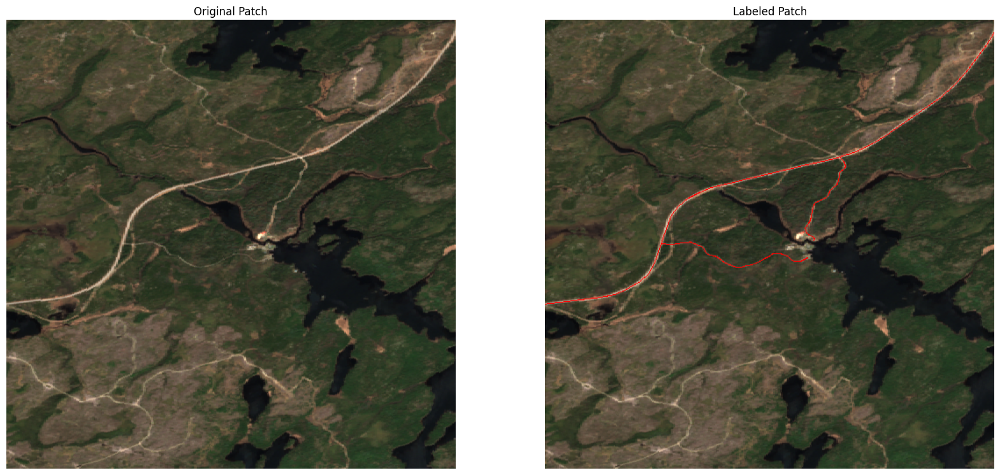

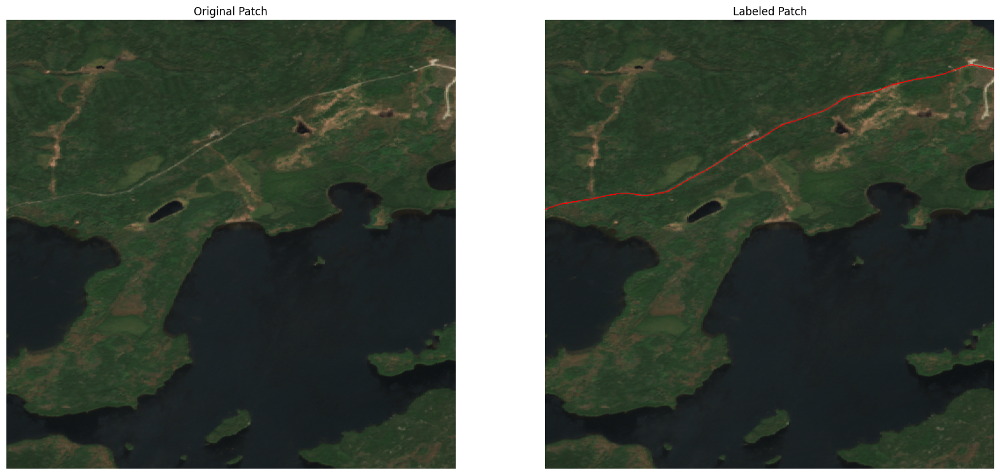

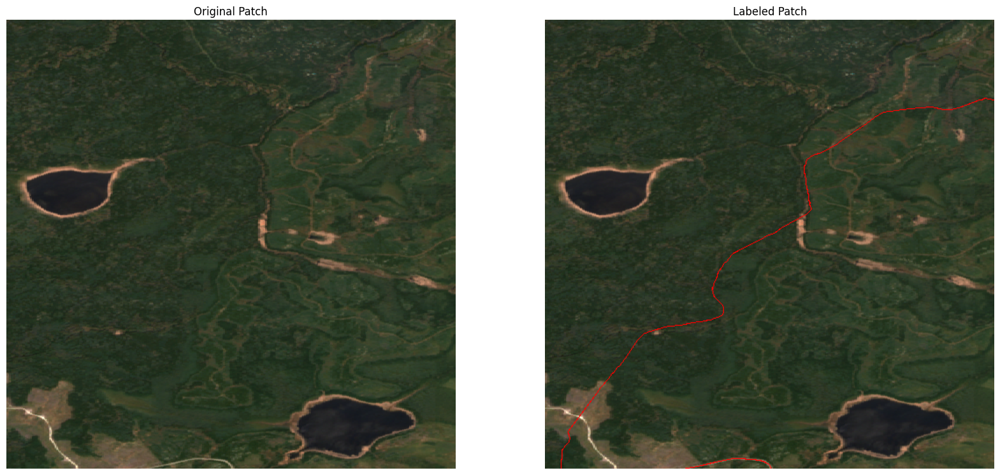

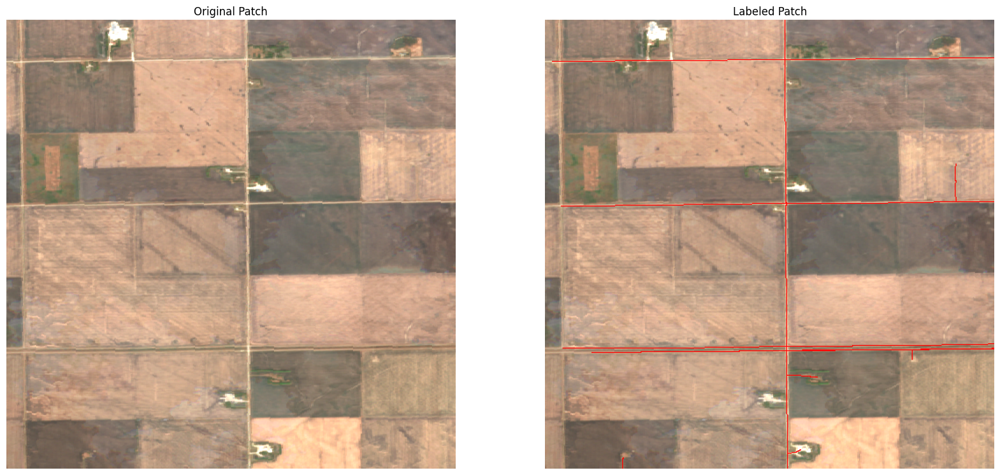

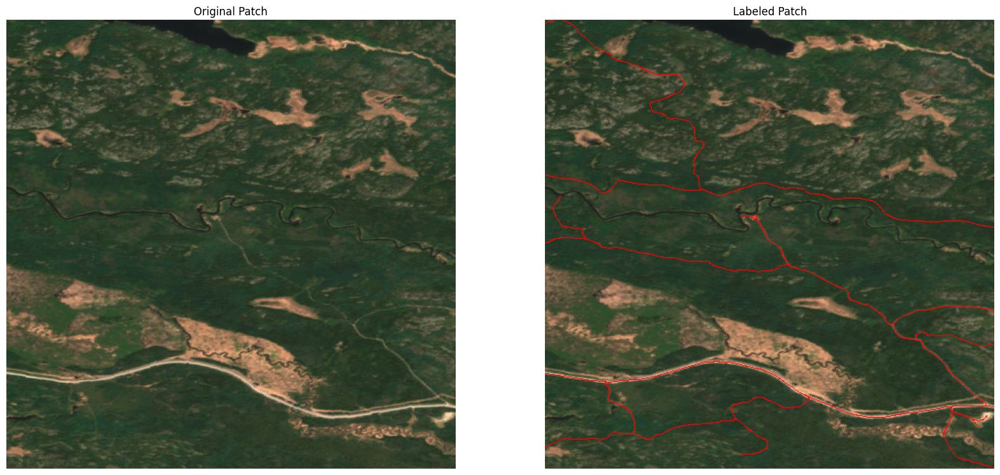

...

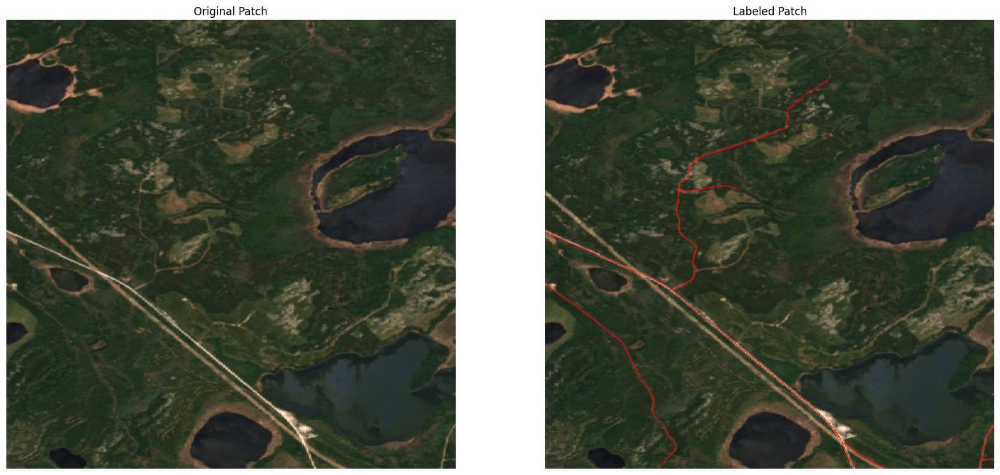

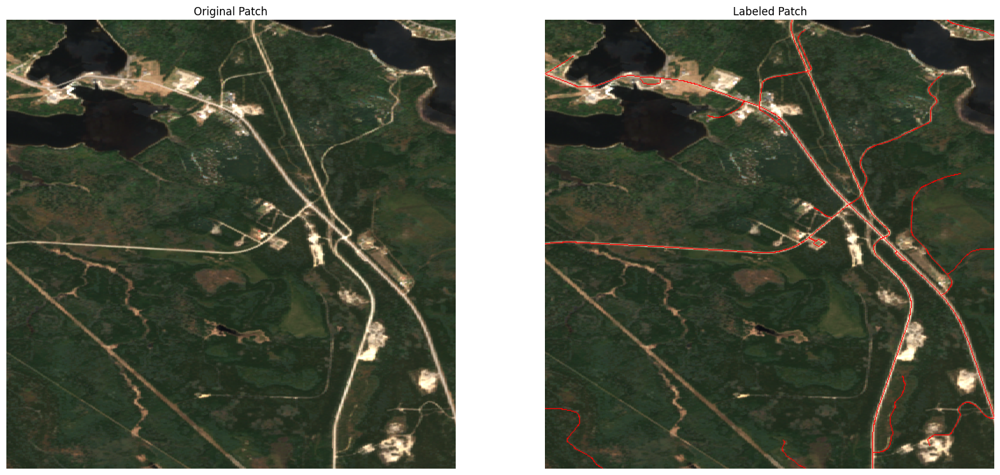

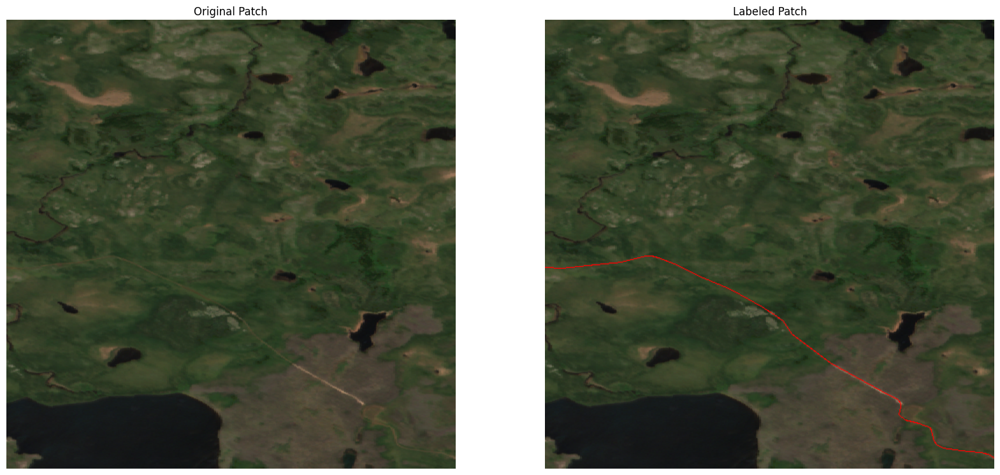

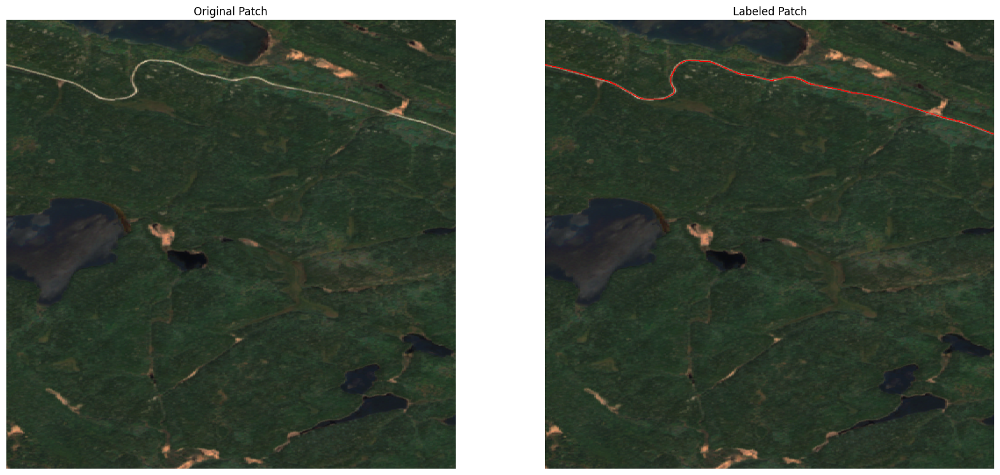

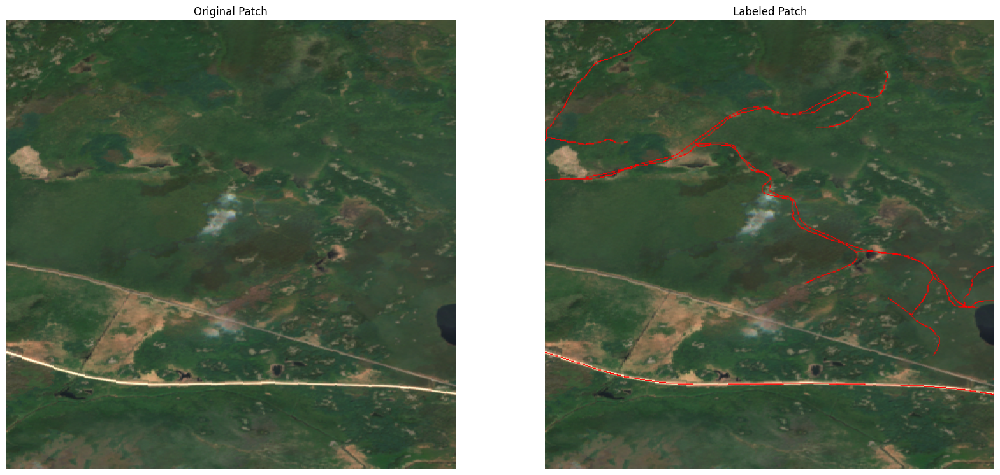

In [30]:
# Reading the patches
patch_image_dir = '/content/drive/MyDrive/OSM_Roads/image/'
patch_mask_dir = '/content/drive/MyDrive/OSM_Roads/mask/'

tiles = []
for subdir, dirs, files in os.walk(patch_image_dir):
    for f in files:
        if isfile(join(patch_image_dir, f)) and '.tif' in f:
            tiles.append([join(patch_image_dir, f), join(patch_mask_dir, f)])

random.shuffle(tiles)
count = 0
for t in tiles:
    [img, xsize, ysize, nbands] = loadTiff(t[0])
    with rasterio.open(t[1]) as src:
        mask = src.read(1)

    count += 1
    # Limiting the display to 3
    if count <= view_limit:
        fig, ax = plt.subplots(1, 2, figsize=(20, 20))
        [img, xsize, ysize, nbands] = loadTiff(t[0], 0.2)
        img_rgb = np.dstack((img[:,:,0], img[:,:,1], img[:,:,2]))
        # Create a red color overlay using the mask
        overlay = np.zeros((img_rgb.shape[0], img_rgb.shape[1], 4))  # 4 for RGBA
        overlay[..., 0] = 1  # Red channel
        overlay[..., 3] = mask

        # Display the original image and the masked image
        ax[0].imshow(img_rgb)
        ax[0].set_title('Original Patch')
        ax[0].axis('off')

        ax[1].imshow(img_rgb, cmap='gray')
        ax[1].imshow(overlay)
        ax[1].set_title('Labeled Patch')
        ax[1].axis('off')

        plt.show()